# Autoencoder Study

## Hypothesis
If we can make an autoencoder with a small loss for a dataset made with images from the game, then its encoder is complex enough to be a feature extractor for the RL model.

## Counterpoint
Even if it autoencodes the images with a relatively small loss, it still could not be sufficient to extract the features that would be really important for a RL agent. We'll keep that in mind and check the results too see if we have any indicative if that point holds true.

In [1]:
import random

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import torch
from torch import nn, optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torchvision.utils import make_grid
from tqdm.notebook import trange

sns.set_theme()
plt.rcParams["figure.figsize"] = (20, 6)

In [2]:
def set_seed(seed=42):
    """Set the seed for reproducibility."""
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False


set_seed(666)

In [3]:
class Encoder(nn.Module):
    def __init__(self, n_input_channels):
        super().__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(
                n_input_channels,
                32,
                kernel_size=8,
                stride=4,
                padding=0,
            ),
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=0),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=0),
            nn.ReLU(),
            nn.Flatten(),
            nn.Linear(in_features=3136, out_features=512, bias=True),
            nn.ReLU(),
        )

    def forward(self, x: torch.Tensor):
        return self.encoder(x)


class Decoder(nn.Module):
    def __init__(self, n_output_channels):
        super().__init__()
        self.decoder = nn.Sequential(
            nn.Linear(in_features=512, out_features=3136),
            nn.ReLU(),
            nn.Unflatten(1, (64, 7, 7)),
            nn.ConvTranspose2d(64, 64, kernel_size=3, stride=1, padding=0),
            nn.ReLU(),
            nn.ConvTranspose2d(
                64,
                32,
                kernel_size=4,
                stride=2,
                padding=0,
                output_padding=0,
            ),
            nn.ReLU(),
            nn.ConvTranspose2d(
                32,
                n_output_channels,
                kernel_size=8,
                stride=4,
                padding=0,
                output_padding=0,
            ),
            nn.ReLU(),
        )

    def forward(self, x):
        x = self.decoder(x)
        return x


class Autoencoder(nn.Module):
    def __init__(self, n_input_channels):
        super().__init__()
        self.encoder = Encoder(n_input_channels)
        self.decoder = Decoder(n_input_channels)

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

## Dataset
The Cutman stage was played for a while and recorded the images from that run. Each sample is a concatenation of every 3 consecutive frames, since that's the input shape we want in the final model.

In [3]:
transform = transforms.Compose([transforms.ToTensor()])
dataset = datasets.ImageFolder(root="dataset", transform=transform)
dataloader = DataLoader(dataset, batch_size=64, shuffle=True)

# Training

In [4]:
def train(model, dataloader, epochs=50):
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=2.5e-4)

    avg_losses = []
    for _ in trange(epochs):
        losses = []
        for data in dataloader:
            imgs, _ = data
            imgs = imgs.cuda()
            outputs = model(imgs.cuda())
            loss = criterion(outputs, imgs)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            losses.append(loss.detach().cpu().numpy())
        avg_losses.append(np.mean(losses))
    sns.lineplot(x=np.arange(1, epochs + 1), y=avg_losses)
    plt.title(f"Average Loss (Final: {avg_losses[-1]:.2e})")
    plt.xlabel("Epoch")
    plt.show()

  0%|          | 0/50 [00:00<?, ?it/s]

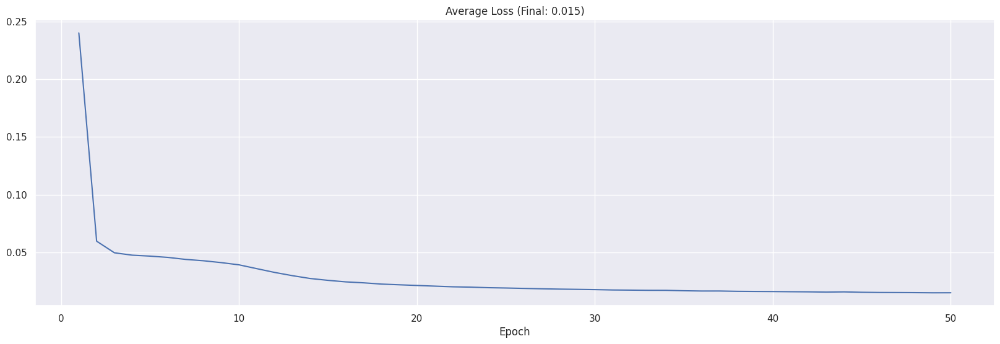

In [6]:
model = Autoencoder(n_input_channels=3).cuda()
train(model, dataloader)

# Visual Inspection of Reconstruction

In [5]:
def imshow(img):
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()


def visualize_reconstructions(model, dataloader, num_images=6):
    model.eval()
    images, _ = next(iter(dataloader))
    images = images.cuda()

    with torch.no_grad():
        outputs = model(images[:num_images])
    outputs = torch.clip(outputs, max=1.0).cpu()
    images = images[:num_images].cpu()

    plt.figure(figsize=(40, 3))
    plt.subplot(1, 2, 1)
    plt.axis("off")
    plt.title("Original Images")
    imshow(make_grid(images, nrow=num_images))

    plt.figure(figsize=(40, 3))
    plt.subplot(1, 2, 2)
    plt.axis("off")
    plt.title("Reconstructed Images")
    imshow(make_grid(outputs, nrow=num_images))

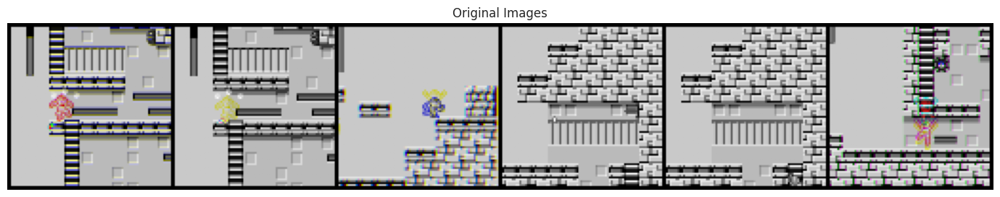

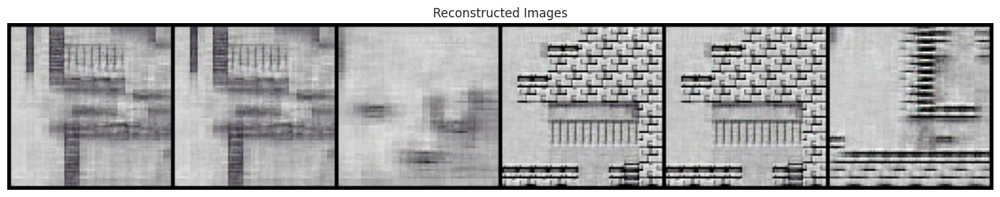

In [7]:
visualize_reconstructions(model, dataloader)

# Sigmoid

Let's start again, but with a sigmoid at the end of the decoder to see if we can stabilize the output.

In [8]:
class SigmoidDecoder(nn.Module):
    def __init__(self, n_output_channels):
        super().__init__()
        self.decoder = nn.Sequential(
            nn.Linear(in_features=512, out_features=3136),
            nn.ReLU(),
            nn.Unflatten(1, (64, 7, 7)),
            nn.ConvTranspose2d(64, 64, kernel_size=3, stride=1, padding=0),
            nn.ReLU(),
            nn.ConvTranspose2d(
                64,
                32,
                kernel_size=4,
                stride=2,
                padding=0,
                output_padding=0,
            ),
            nn.ReLU(),
            nn.ConvTranspose2d(
                32,
                n_output_channels,
                kernel_size=8,
                stride=4,
                padding=0,
                output_padding=0,
            ),
            nn.Sigmoid(),
        )

    def forward(self, x):
        x = self.decoder(x)
        return x


class SigmoidAutoencoder(nn.Module):
    def __init__(self, n_input_channels):
        super().__init__()
        self.encoder = Encoder(n_input_channels)
        self.decoder = SigmoidDecoder(n_input_channels)

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

  0%|          | 0/50 [00:00<?, ?it/s]

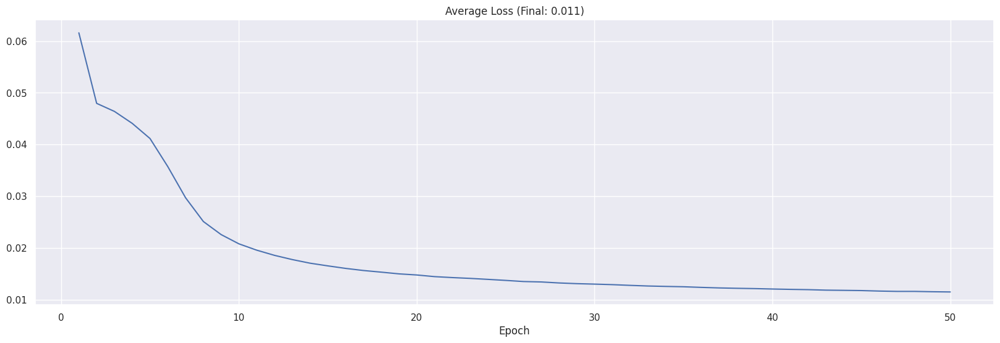

In [9]:
model = SigmoidAutoencoder(n_input_channels=3).cuda()
train(model, dataloader)

Not great, but better.

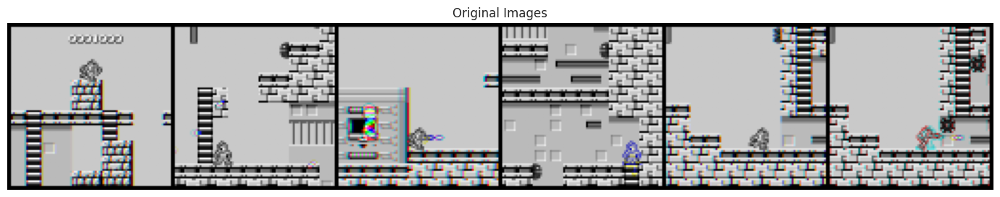

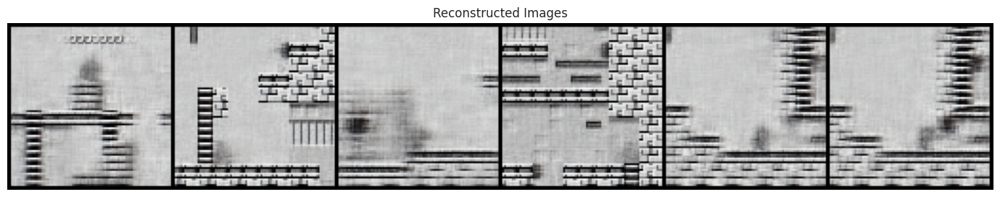

In [10]:
visualize_reconstructions(model, dataloader)

# Increasing Autoencoder complexity

Now, let's start pumping this little bastard up. We're currently underfitting (average MSE of 0.011 is roughly equivalent to ~10% of each pixel of each image being wrong, which is considerably high), so let's try to overfit the dataset. Any changes we do here will be mainly focused on the encoder, since the decoder is basically its "mirror" and won't be used in the final model.

There are lots of different things to try here, but let's focus on model capacity first. We could try:
* increasing filter counts;
* increasing encoder's output dimension size;
* adding more layers;

If we're lucky, the first two will be enough. Let's start acting on the most obvious bottleneck (almost literally, if we think about how the neural network _shrinks_ in the middle), which is the linear layer:

In [15]:
class WiderDimensionEncoder(nn.Module):
    def __init__(self, n_input_channels):
        super().__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(
                n_input_channels,
                32,
                kernel_size=8,
                stride=4,
                padding=0,
            ),
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=0),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=0),
            nn.ReLU(),
            nn.Flatten(),
            nn.Linear(in_features=3136, out_features=1024, bias=True),
            nn.ReLU(),
        )

    def forward(self, x: torch.Tensor):
        return self.encoder(x)


class WiderDimensionDecoder(nn.Module):
    def __init__(self, n_output_channels):
        super().__init__()
        self.decoder = nn.Sequential(
            nn.Linear(in_features=1024, out_features=3136),
            nn.ReLU(),
            nn.Unflatten(1, (64, 7, 7)),
            nn.ConvTranspose2d(64, 64, kernel_size=3, stride=1, padding=0),
            nn.ReLU(),
            nn.ConvTranspose2d(
                64,
                32,
                kernel_size=4,
                stride=2,
                padding=0,
                output_padding=0,
            ),
            nn.ReLU(),
            nn.ConvTranspose2d(
                32,
                n_output_channels,
                kernel_size=8,
                stride=4,
                padding=0,
                output_padding=0,
            ),
            nn.Sigmoid(),
        )

    def forward(self, x):
        x = self.decoder(x)
        return x


class WiderDimensionAutoencoder(nn.Module):
    def __init__(self, n_input_channels):
        super().__init__()
        self.encoder = WiderDimensionEncoder(n_input_channels)
        self.decoder = WiderDimensionDecoder(n_input_channels)

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

  0%|          | 0/50 [00:00<?, ?it/s]

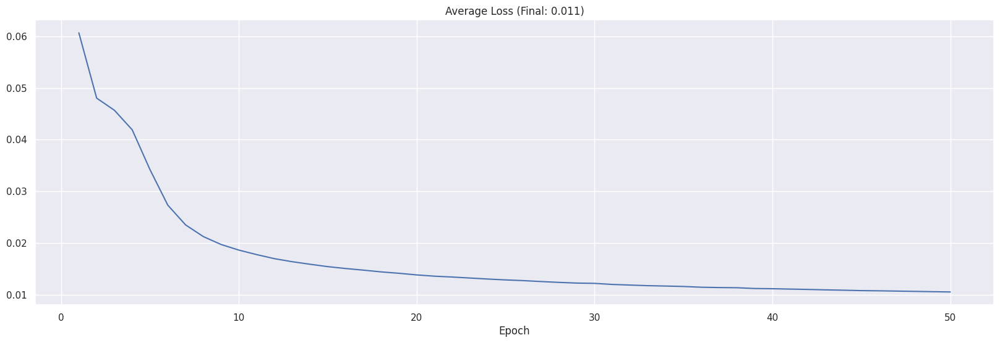

In [16]:
model = WiderDimensionAutoencoder(n_input_channels=3).cuda()
train(model, dataloader)

Nope.

Let's increase filter counts:

In [21]:
class HighFilterCountEncoder(nn.Module):
    def __init__(self, n_input_channels):
        super().__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(
                n_input_channels,
                64,
                kernel_size=8,
                stride=4,
                padding=0,
            ),
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=0),
            nn.ReLU(),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=0),
            nn.ReLU(),
            nn.Flatten(),
            nn.Linear(in_features=6272, out_features=512, bias=True),
            nn.ReLU(),
        )

    def forward(self, x: torch.Tensor):
        return self.encoder(x)


class HighFilterCountDecoder(nn.Module):
    def __init__(self, n_output_channels):
        super().__init__()
        self.decoder = nn.Sequential(
            nn.Linear(in_features=512, out_features=6272),
            nn.ReLU(),
            nn.Unflatten(1, (128, 7, 7)),
            nn.ConvTranspose2d(128, 128, kernel_size=3, stride=1, padding=0),
            nn.ReLU(),
            nn.ConvTranspose2d(
                128,
                64,
                kernel_size=4,
                stride=2,
                padding=0,
                output_padding=0,
            ),
            nn.ReLU(),
            nn.ConvTranspose2d(
                64,
                n_output_channels,
                kernel_size=8,
                stride=4,
                padding=0,
                output_padding=0,
            ),
            nn.Sigmoid(),
        )

    def forward(self, x):
        x = self.decoder(x)
        return x


class HighFilterCountAutoencoder(nn.Module):
    def __init__(self, n_input_channels):
        super().__init__()
        self.encoder = HighFilterCountEncoder(n_input_channels)
        self.decoder = HighFilterCountDecoder(n_input_channels)

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

  0%|          | 0/50 [00:00<?, ?it/s]

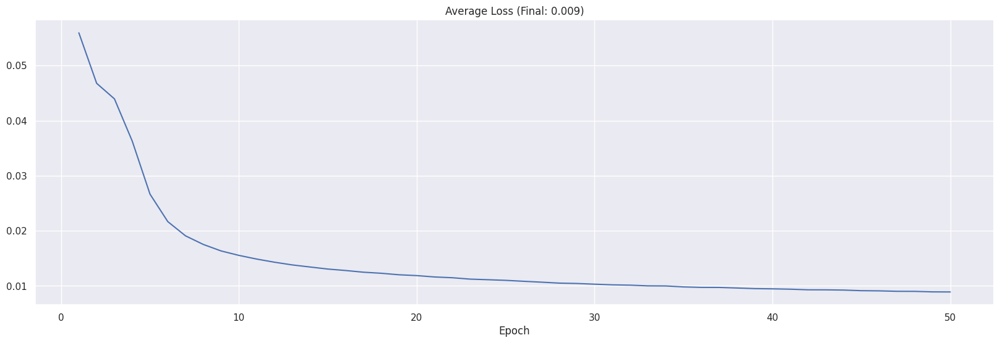

In [24]:
model = HighFilterCountAutoencoder(n_input_channels=3).cuda()
train(model, dataloader, epochs=50)

Final MSE of 0.009, roughly equivalent to 9.5% errors on each pixel, which is not much better than what we had. We could be training these new trials for a few more epochs since they are more complex models, but the plot trend isn't very promising.

Let's keep this improvement and try adding a new layer:

In [60]:
class MoreLayersEncoder(nn.Module):
    def __init__(self, n_input_channels):
        super().__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(
                n_input_channels,
                32,
                kernel_size=8,
                stride=4,
                padding=0,
            ),
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=4, stride=2, padding=0),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, stride=2, padding=0),
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=0),
            nn.ReLU(),
            nn.Flatten(),
            nn.Linear(in_features=512, out_features=512, bias=True),
            nn.ReLU(),
        )

    def forward(self, x: torch.Tensor):
        return self.encoder(x)


class MoreLayersDecoder(nn.Module):
    def __init__(self, n_output_channels):
        super().__init__()
        self.decoder = nn.Sequential(
            nn.Linear(in_features=512, out_features=512),
            nn.ReLU(),
            nn.Unflatten(1, (128, 2, 2)),
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=1, padding=0),
            nn.ReLU(),
            nn.ConvTranspose2d(
                64,
                64,
                kernel_size=3,
                stride=2,
                padding=0,
                output_padding=0,
            ),
            nn.ReLU(),
            nn.ConvTranspose2d(
                64,
                32,
                kernel_size=4,
                stride=2,
                padding=0,
                output_padding=0,
            ),
            nn.ReLU(),
            nn.ConvTranspose2d(
                32,
                n_output_channels,
                kernel_size=8,
                stride=4,
                padding=0,
                output_padding=0,
            ),
            nn.Sigmoid(),
        )

    def forward(self, x):
        x = self.decoder(x)
        return x


class MoreLayersAutoencoder(nn.Module):
    def __init__(self, n_input_channels):
        super().__init__()
        self.encoder = MoreLayersEncoder(n_input_channels)
        self.decoder = MoreLayersDecoder(n_input_channels)

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

Let's actually train a little more on this one:

  0%|          | 0/70 [00:00<?, ?it/s]

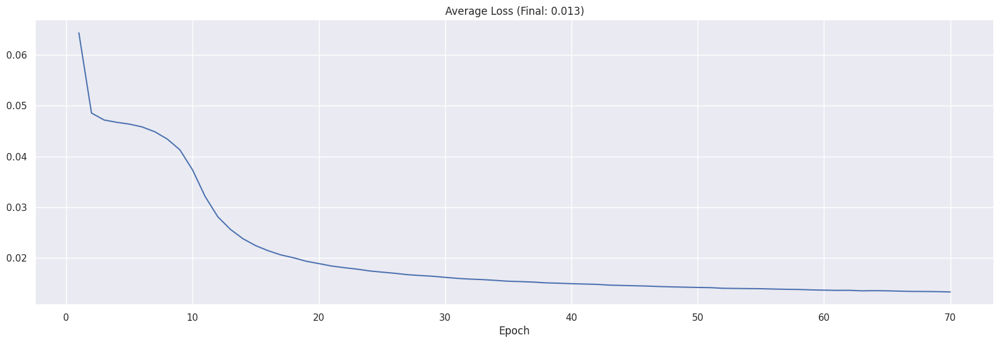

In [62]:
model = MoreLayersAutoencoder(n_input_channels=3).cuda()
train(model, dataloader, epochs=70)

We're out of luck here. We could try a few more things:
* Using different activations;
* Skipping connections (like the ResNet architecture);
  
Let's start with LeakyReLU:

In [63]:
class LeakyEncoder(nn.Module):
    def __init__(self, n_input_channels):
        super().__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(
                n_input_channels,
                64,
                kernel_size=8,
                stride=4,
                padding=0,
            ),
            nn.LeakyReLU(),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=0),
            nn.LeakyReLU(),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=0),
            nn.LeakyReLU(),
            nn.Flatten(),
            nn.Linear(in_features=6272, out_features=512, bias=True),
            nn.LeakyReLU(),
        )

    def forward(self, x: torch.Tensor):
        return self.encoder(x)


class LeakyDecoder(nn.Module):
    def __init__(self, n_output_channels):
        super().__init__()
        self.decoder = nn.Sequential(
            nn.Linear(in_features=512, out_features=6272),
            nn.LeakyReLU(),
            nn.Unflatten(1, (128, 7, 7)),
            nn.ConvTranspose2d(128, 128, kernel_size=3, stride=1, padding=0),
            nn.LeakyReLU(),
            nn.ConvTranspose2d(
                128,
                64,
                kernel_size=4,
                stride=2,
                padding=0,
                output_padding=0,
            ),
            nn.LeakyReLU(),
            nn.ConvTranspose2d(
                64,
                n_output_channels,
                kernel_size=8,
                stride=4,
                padding=0,
                output_padding=0,
            ),
            nn.Sigmoid(),
        )

    def forward(self, x):
        x = self.decoder(x)
        return x


class LeakyAutoencoder(nn.Module):
    def __init__(self, n_input_channels):
        super().__init__()
        self.encoder = LeakyEncoder(n_input_channels)
        self.decoder = LeakyDecoder(n_input_channels)

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

  0%|          | 0/50 [00:00<?, ?it/s]

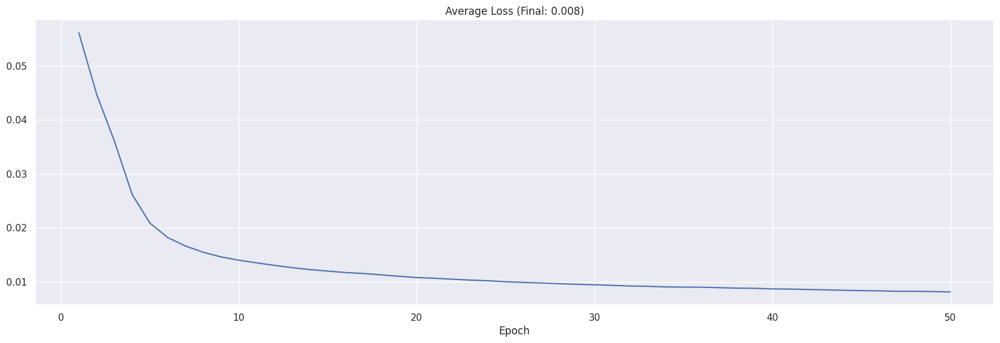

In [64]:
model = LeakyAutoencoder(n_input_channels=3).cuda()
train(model, dataloader, epochs=50)

Better, but let's try ELU:

In [65]:
class EluEncoder(nn.Module):
    def __init__(self, n_input_channels):
        super().__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(
                n_input_channels,
                64,
                kernel_size=8,
                stride=4,
                padding=0,
            ),
            nn.ELU(),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=0),
            nn.ELU(),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=0),
            nn.ELU(),
            nn.Flatten(),
            nn.Linear(in_features=6272, out_features=512, bias=True),
            nn.ELU(),
        )

    def forward(self, x: torch.Tensor):
        return self.encoder(x)


class EluDecoder(nn.Module):
    def __init__(self, n_output_channels):
        super().__init__()
        self.decoder = nn.Sequential(
            nn.Linear(in_features=512, out_features=6272),
            nn.ELU(),
            nn.Unflatten(1, (128, 7, 7)),
            nn.ConvTranspose2d(128, 128, kernel_size=3, stride=1, padding=0),
            nn.ELU(),
            nn.ConvTranspose2d(
                128,
                64,
                kernel_size=4,
                stride=2,
                padding=0,
                output_padding=0,
            ),
            nn.ELU(),
            nn.ConvTranspose2d(
                64,
                n_output_channels,
                kernel_size=8,
                stride=4,
                padding=0,
                output_padding=0,
            ),
            nn.Sigmoid(),
        )

    def forward(self, x):
        x = self.decoder(x)
        return x


class EluAutoencoder(nn.Module):
    def __init__(self, n_input_channels):
        super().__init__()
        self.encoder = EluEncoder(n_input_channels)
        self.decoder = EluDecoder(n_input_channels)

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

  0%|          | 0/50 [00:00<?, ?it/s]

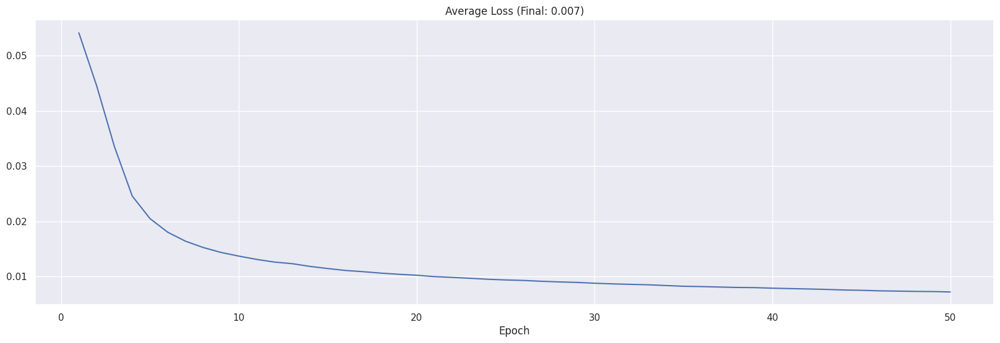

In [66]:
model = EluAutoencoder(n_input_channels=3).cuda()
train(model, dataloader, epochs=50)

Good. Now we have a RMSE of 8.4%.

Let's try skipping connections:

In [7]:
class SkippingEncoder(nn.Module):
    def __init__(self, n_input_channels):
        super().__init__()
        # Define individual layers/components for flexibility
        self.conv1 = nn.Conv2d(
            n_input_channels,
            64,
            kernel_size=8,
            stride=4,
            padding=0,
        )
        self.elu1 = nn.ELU()
        self.conv2 = nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=0)
        self.elu2 = nn.ELU()
        self.conv3 = nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=0)
        self.elu3 = nn.ELU()
        self.flatten = nn.Flatten()
        self.fc = nn.Linear(in_features=6272, out_features=512, bias=True)
        self.elu4 = nn.ELU()

    def forward(self, x):
        x1 = self.elu1(self.conv1(x))
        x2 = self.elu2(self.conv2(x1))
        x3 = self.elu3(self.conv3(x2))
        x_flatten = self.flatten(x3)
        encoded = self.elu4(self.fc(x_flatten))
        return encoded, x3, x2, x1


class SkippingDecoder(nn.Module):
    def __init__(self, n_output_channels):
        super().__init__()
        self.fc = nn.Linear(in_features=512, out_features=6272)
        self.elu1 = nn.ELU()
        self.unflatten = nn.Unflatten(1, (128, 7, 7))
        self.deconv1 = nn.ConvTranspose2d(
            128,
            128,
            kernel_size=3,
            stride=1,
            padding=0,
        )
        self.elu2 = nn.ELU()
        self.deconv2 = nn.ConvTranspose2d(
            128,
            64,
            kernel_size=4,
            stride=2,
            padding=0,
            output_padding=0,
        )
        self.elu3 = nn.ELU()
        self.deconv3 = nn.ConvTranspose2d(
            64,
            n_output_channels,
            kernel_size=8,
            stride=4,
            padding=0,
            output_padding=0,
        )
        self.sigmoid = nn.Sigmoid()

    def forward(self, encoded, skip3, skip2, skip1):
        x = self.elu1(self.fc(encoded))
        x = self.unflatten(x)
        x = self.elu2(self.deconv1(x + skip3))
        x = self.elu3(self.deconv2(x + skip2))
        x = self.sigmoid(self.deconv3(x + skip1))
        return x


class SkippingAutoencoder(nn.Module):
    def __init__(self, n_input_channels):
        super().__init__()
        self.encoder = SkippingEncoder(n_input_channels)
        self.decoder = SkippingDecoder(n_input_channels)

    def forward(self, x):
        encoded, skip3, skip2, skip1 = self.encoder(x)
        decoded = self.decoder(encoded, skip3, skip2, skip1)
        return decoded

  0%|          | 0/50 [00:00<?, ?it/s]

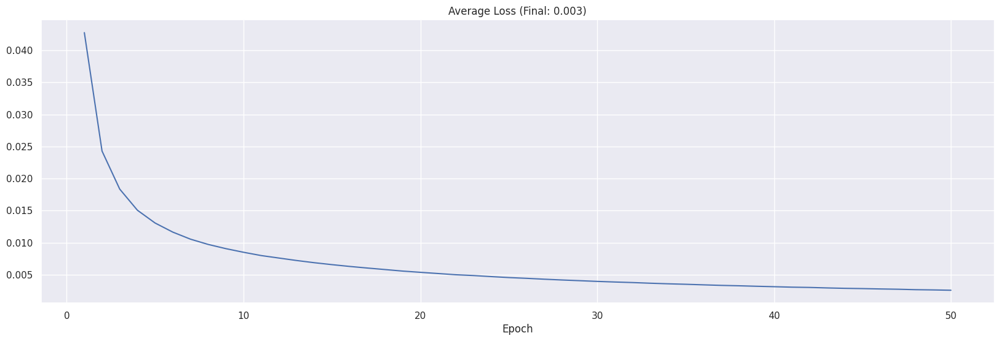

In [69]:
model = SkippingAutoencoder(n_input_channels=3).cuda()
train(model, dataloader, epochs=50)

Great! Now we have a RMSE of 5.5%. Let's see if training for a little more would further decrease loss:

  0%|          | 0/100 [00:00<?, ?it/s]

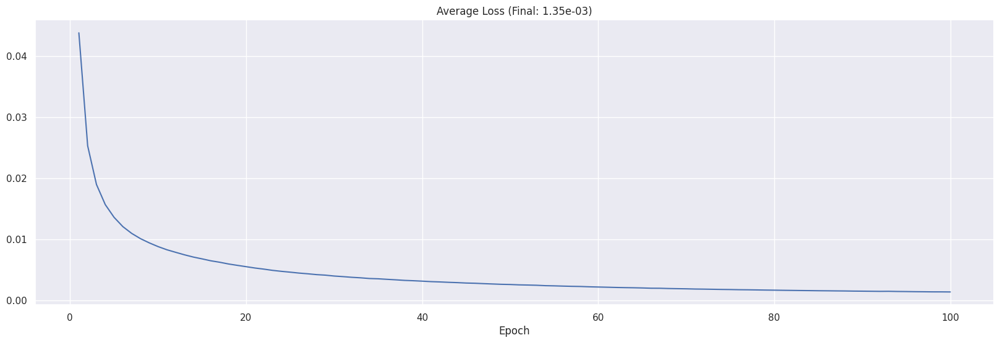

In [8]:
model = SkippingAutoencoder(n_input_channels=3).cuda()
train(model, dataloader, epochs=100)

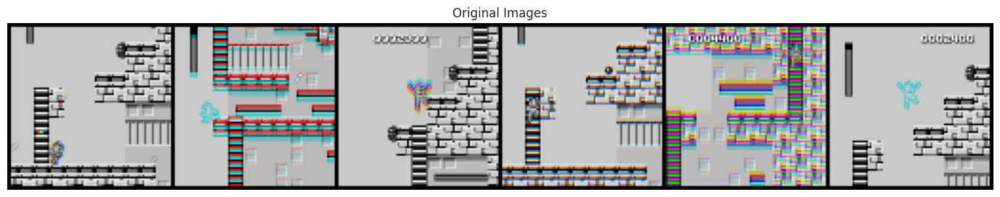

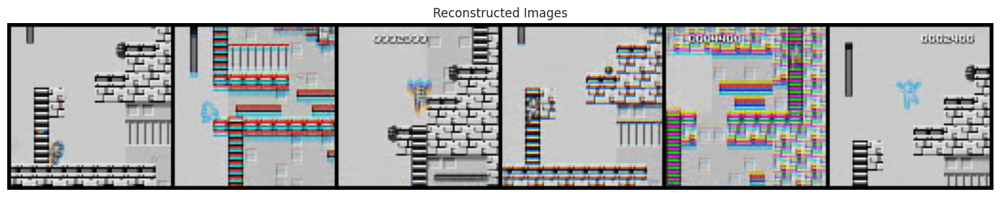

In [9]:
visualize_reconstructions(model, dataloader)

Much much better! Let's see if we can visualize filters with our nn_visualizer module.

100%|██████████| 64/64 [00:06<00:00, 10.53it/s]


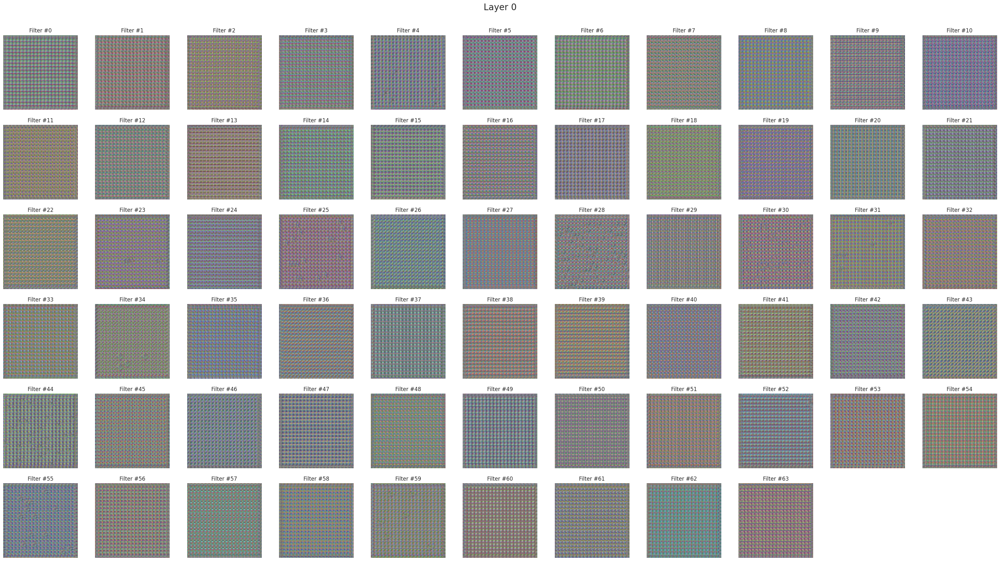

100%|██████████| 128/128 [00:15<00:00,  8.52it/s]


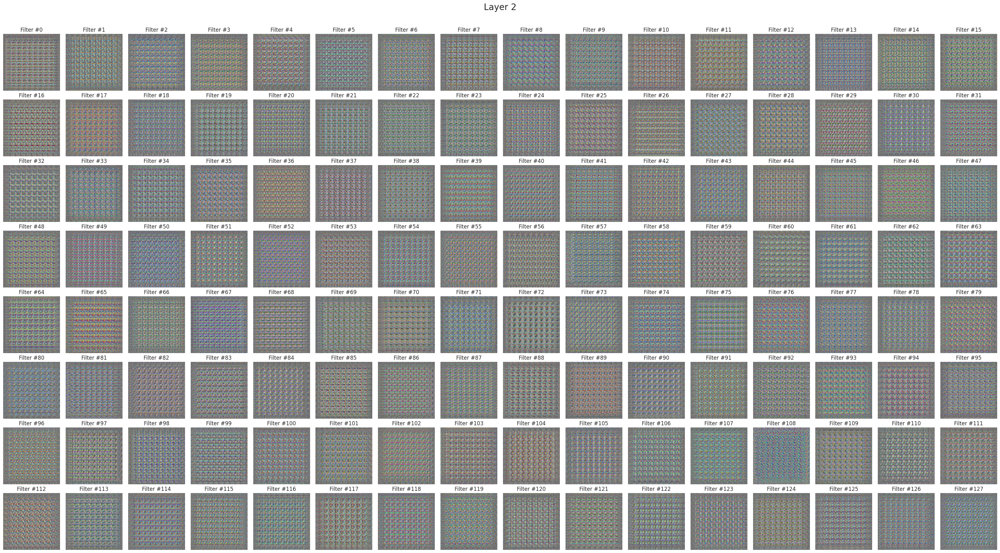

100%|██████████| 128/128 [00:17<00:00,  7.32it/s]


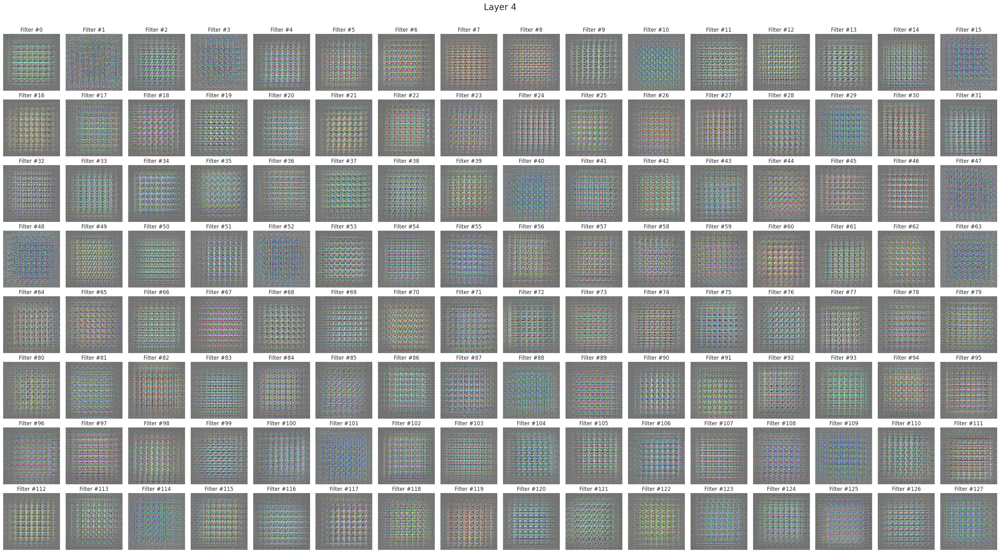

In [10]:
from megai_man.nn_visualizer import make_layer_grid


layers = list(model.encoder.children())
for layer_idx, layer in enumerate(layers):
    if isinstance(layer, nn.ELU):
        intermediate_model = nn.Sequential(*layers[: layer_idx + 1])
        conv2d_idx = layer_idx - 1
        if not isinstance(layers[conv2d_idx], nn.Conv2d):
            continue
        make_layer_grid(
            model=intermediate_model,
            out_size=layers[conv2d_idx].out_channels,
            layer_idx=conv2d_idx,
            save=False,
        )

Only for the last channel (most recent observation) now:

100%|██████████| 64/64 [00:05<00:00, 10.89it/s]


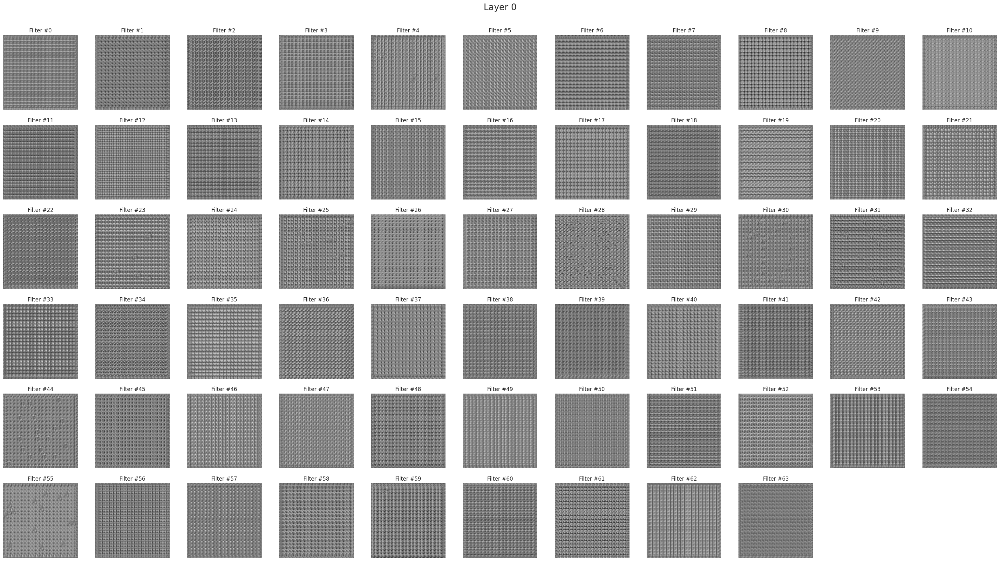

100%|██████████| 128/128 [00:14<00:00,  8.61it/s]


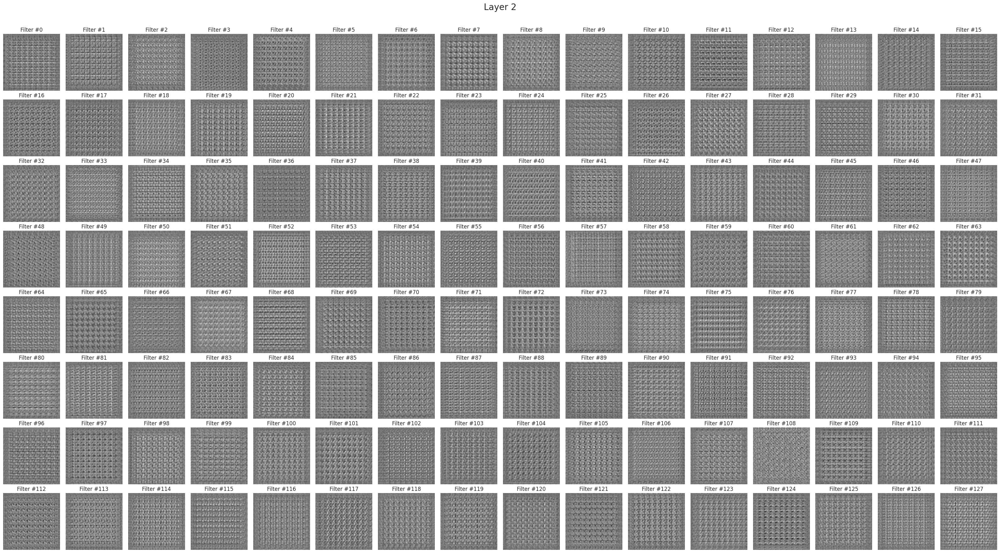

100%|██████████| 128/128 [00:17<00:00,  7.14it/s]


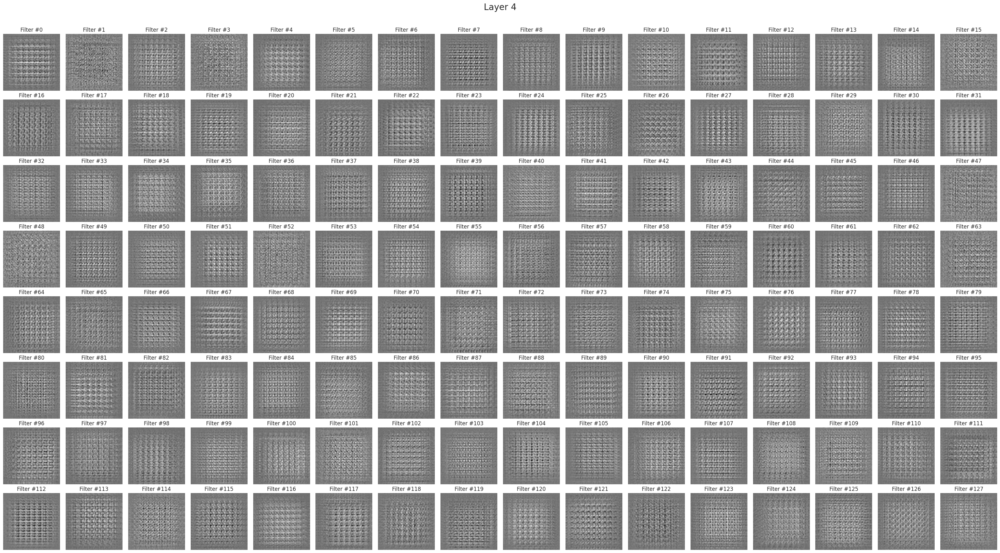

In [24]:
layers = list(model.encoder.children())
for layer_idx, layer in enumerate(layers):
    if isinstance(layer, nn.ELU):
        intermediate_model = nn.Sequential(*layers[: layer_idx + 1])
        conv2d_idx = layer_idx - 1
        if not isinstance(layers[conv2d_idx], nn.Conv2d):
            continue
        make_layer_grid(
            model=intermediate_model,
            out_size=layers[conv2d_idx].out_channels,
            layer_idx=conv2d_idx,
            channel=2,
            save=False,
        )

In [25]:
torch.save(model.encoder, "models/pretrained_feature_extractor.pth")

# Conclusion

Now, we're ready to start testing with this new architecture. We are going to train for much less epochs during RL loop, because otherwise it would take too long (we'll start with 20 epochs).

Another interesting approach would be using this trained encoder as the starting point for the feature extractor at the beggining of the training.

The RL training loop is outside of the scope of this notebook.

Obs.: I just realized that I implemented the skipping layer trick only on the decoder side and that won't work in the RL model as stable-baselines3 implements the default pipeline. We'll keep that in mind in the future and test with this last encoder architecture anyway.